## Experiment 3: Reward plotted - Baselines
Author : @leopauly | cnlp@leeds.ac.uk <br>
Description : Plotting reward functions for 2 manipulation tasks

In [1]:
import os
from six.moves import xrange
import random
import PIL.Image as Image
import numpy as np
import cv2
import time
import math
import matplotlib.pyplot as plt
import tensorflow as tf
from keras import backend as K
import matplotlib as mpl
import matplotlib.patches as mpatches
from matplotlib.ticker import MaxNLocator
from skimage.transform import rotate

# Custom scripts
import lscript as lsp
import modelling as md
import dataset as dset

Using TensorFlow backend.


In [2]:
height=112 
width=112 
channel=3
crop_size=112
cluster_length=16
#feature_size=8192 #4096
baseline_feature_size=4608

strides=2
total_frames_in_seq=79 # Check always
num_clusters= int( (total_frames_in_seq-cluster_length) / strides) + 1
saved_path='/nobackup/leopauly/logdirk80_1_rand_frames'

### Baseline

#### Defining model

In [3]:
base_model=md.get_vgg16_imagenet(summary=True,include_fc=False)
#print([n.name for n in tf.get_default_graph().as_graph_def().node])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0         
__________

#### Feature extraction 

In [4]:
def get_compress_frames_data(filename,normalisation,print_filenames=False):
  ''' Given a directory containing extracted frames, return a np array with all the frames '''
  
  ret_arr = []
  for parent, dirnames, filenames in os.walk(filename):

    filenames = sorted(filenames)
    if (print_filenames):
        print('filenames:',filenames)
    
    for i in range(0,len(filenames)):
      if (filenames[i].endswith('.png')):
        image_name = str(filename) + '/' + str(filenames[i])
        img = Image.open(image_name)
        img_data = np.array(img)
        ret_arr.append(img_data)
        
  ret_arr=np.array(ret_arr)
  if (normalisation==True):
        ret_arr=ret_arr/255
  return np.array(ret_arr)

In [5]:
def preprocess(im):
        im = np.float32(im)
        im[:,:,2] -= 103.939
        im[:,:,1] -= 116.779
        im[:,:,0] -= 123.68
        im = im[:, :, ::-1]  # change to BGR
        return im

In [6]:
## Extraction of features - baseline
def basline_feature_from_clustures(cluster_vid):
    
    sum_val=0
    for i in range(cluster_length):
        frame_=cluster_vid[i]
        
        frame=preprocess(frame_)
        frame=frame.reshape(-1,height,width,channel)
        temp_val=base_model.predict(frame)
        temp_val=temp_val.reshape(baseline_feature_size)
        sum_val=sum_val+temp_val
    
    
    features=sum_val/cluster_length
    return features

In [7]:
def activity_feature_extraction(vids):
    ## Splitting into clusters the video of source demonstration
    x = vids
    x =x.reshape(1,x.shape[0],height,width,channel)
    clusters=dset.clusters_with_strides(x,num_clusters,cluster_length,height,width,channel,strides)

    ## Extraction of features
    print('shape of clustered demo data:',clusters.shape)
    features=np.zeros([num_clusters,baseline_feature_size])
    for i in range(num_clusters):
        t=clusters[i]
        f_v_val=basline_feature_from_clustures(t)
        t_f=f_v_val.reshape(-1)
        features[i]= t_f   
    return features,clusters

##### Demo

True
filenames: ['000.png', '001.png', '002.png', '003.png', '004.png', '005.png', '006.png', '007.png', '008.png', '009.png', '010.png', '011.png', '012.png', '013.png', '014.png', '015.png', '016.png', '017.png', '018.png', '019.png', '020.png', '021.png', '022.png', '023.png', '024.png', '025.png', '026.png', '027.png', '028.png', '029.png', '030.png', '031.png', '032.png', '033.png', '034.png', '035.png', '036.png', '037.png', '038.png', '039.png', '040.png', '041.png', '042.png', '043.png', '044.png', '045.png', '046.png', '047.png', '048.png', '049.png', '050.png', '051.png', '052.png', '053.png', '054.png', '055.png', '056.png', '057.png', '058.png', '059.png', '060.png', '061.png', '062.png', '063.png', '064.png', '065.png', '066.png', '067.png', '068.png', '069.png', '070.png', '071.png', '072.png', '073.png', '074.png', '075.png', '076.png', '077.png', '078.png', '079.png', '080.png', '081.png', '082.png', '083.png', '084.png', '085.png', '086.png', '087.png', '088.png', '089

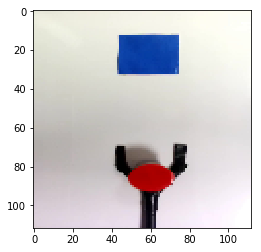

In [8]:
imagefolderpath= ('/nobackup/leopauly/IROSDataset/IROSExpDataset/Demo_push_0deg') 
print(os.path.isdir(imagefolderpath))
vids=get_compress_frames_data(imagefolderpath,normalisation=False,print_filenames=True)
print('Demo images array shape:',vids.shape)

lsp.view_image(vids[0])

In [9]:
x_demo_original=vids
features_demo,clusters_demo=activity_feature_extraction(vids)
print('shape of features from Demo action: ',features_demo.shape)

(32, 16, 112, 112, 3)
shape of clustered demo data: (32, 16, 112, 112, 3)
shape of features from Demo action:  (32, 4608)


##### Robo0 - 0 Degree

True
Robo images array shape: (117, 112, 112, 3)


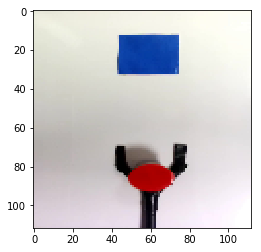

In [10]:
imagefolderpath= ('/nobackup/leopauly/IROSDataset/IROSExpDataset/Demo_push_0deg') 
print(os.path.isdir(imagefolderpath))
vids=get_compress_frames_data(imagefolderpath,normalisation=False)
print('Robo images array shape:',vids.shape)

lsp.view_image(vids[0])

In [11]:
x_robo0_original=vids
features_robo0,clusters_robo0=activity_feature_extraction(vids)
print('shape of features from roobo0 action: ',features_robo0.shape)

(32, 16, 112, 112, 3)
shape of clustered demo data: (32, 16, 112, 112, 3)
shape of features from roobo0 action:  (32, 4608)


##### Robo- 0: Colour changed

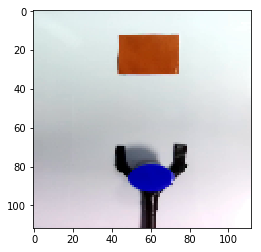

In [12]:
## Changing color
for i in range(len(vids)):
    im_=vids[i][:,:,::-1]
    vids[i]=im_
lsp.view_image(vids[0])

In [13]:
x_robo0c_original=vids
features_robo0c,clusters_robo0c=activity_feature_extraction(vids)
print('shape of features from roobo0c action: ',features_robo0c.shape)

(32, 16, 112, 112, 3)
shape of clustered demo data: (32, 16, 112, 112, 3)
shape of features from roobo0c action:  (32, 4608)


##### Robo90- 90 degree

True
Robo images array shape: (117, 112, 112, 3)


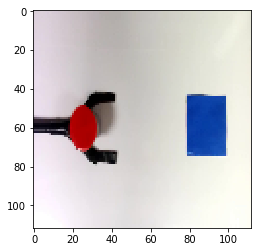

In [14]:
imagefolderpath= ('/nobackup/leopauly/IROSDataset/IROSExpDataset/Demo_push_90deg') 
print(os.path.isdir(imagefolderpath))
vids=get_compress_frames_data(imagefolderpath,normalisation=False)
print('Robo images array shape:',vids.shape)

lsp.view_image(vids[0])

In [15]:
x_robo90_original=vids
features_robo90,clusters_robo90=activity_feature_extraction(vids)
print('shape of features from roobo90 action: ',features_robo90.shape)

(32, 16, 112, 112, 3)
shape of clustered demo data: (32, 16, 112, 112, 3)
shape of features from roobo90 action:  (32, 4608)


##### Robo90 - 90 degree: Colour changed

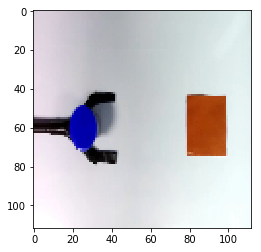

In [16]:
## Changing color
for i in range(len(vids)):
    im_=vids[i][:,:,::-1]
    vids[i]=im_
lsp.view_image(vids[0])

In [17]:
x_robo90c_original=vids
features_robo90c,clusters_robo90c=activity_feature_extraction(vids)
print('shape of features from roobo90c action: ',features_robo90c.shape)

(32, 16, 112, 112, 3)
shape of clustered demo data: (32, 16, 112, 112, 3)
shape of features from roobo90c action:  (32, 4608)


##### Robo180 - 180 degree

True
Robo2 images array shape: (117, 112, 112, 3)


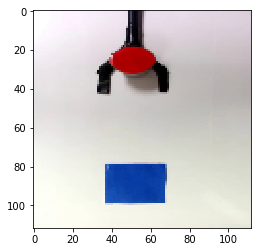

In [18]:
imagefolderpath= ('/nobackup/leopauly/IROSDataset/demo_new/Demo_push_180') 
print(os.path.isdir(imagefolderpath))
vids=get_compress_frames_data(imagefolderpath,normalisation=False)
print('Robo2 images array shape:',vids.shape)

lsp.view_image(vids[0])

In [19]:
x_robo180_original=vids
features_robo180,clusters_robo180=activity_feature_extraction(vids)
print('shape of features from roobo180 action: ',features_robo180.shape)

(32, 16, 112, 112, 3)
shape of clustered demo data: (32, 16, 112, 112, 3)
shape of features from roobo180 action:  (32, 4608)


##### Robo180 - 180 degree: Colour changed

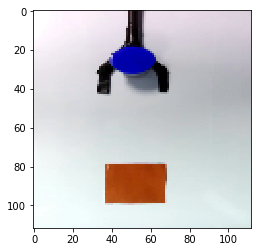

In [20]:
## Changing color
for i in range(len(vids)):
    im_=vids[i][:,:,::-1]
    vids[i]=im_
lsp.view_image(vids[0])

In [21]:
x_robo180c_original=vids
features_robo180c,clusters_robo180c=activity_feature_extraction(vids)
print('shape of features from roobo180c action: ',features_robo180c.shape)

(32, 16, 112, 112, 3)
shape of clustered demo data: (32, 16, 112, 112, 3)
shape of features from roobo180c action:  (32, 4608)


##### Robo270 - 270 degree

True
Robo3 images array shape: (117, 112, 112, 3)


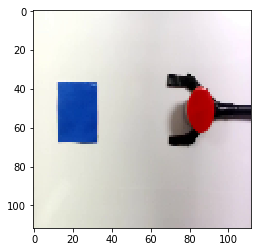

In [22]:
#imagefolderpath= ('/nobackup/leopauly/IROSDataset/IROSExpDataset/Demo_push_45deg') 
imagefolderpath= ('/nobackup/leopauly/IROSDataset/demo_new/Demo_push_270') 
print(os.path.isdir(imagefolderpath))
vids=get_compress_frames_data(imagefolderpath,normalisation=False)
print('Robo3 images array shape:',vids.shape)
lsp.view_image(vids[0])

In [23]:
x_robo270_original=vids
features_robo270,clusters_robo270=activity_feature_extraction(vids)
print('shape of features from roobo270 action: ',features_robo270.shape)

(32, 16, 112, 112, 3)
shape of clustered demo data: (32, 16, 112, 112, 3)
shape of features from roobo270 action:  (32, 4608)


##### Robo270 - 270 degree : Colour

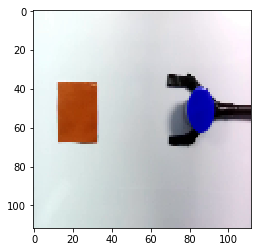

In [24]:
## Changing color
for i in range(len(vids)):
    im_=vids[i][:,:,::-1]
    vids[i]=im_
lsp.view_image(vids[0])

In [25]:
x_robo270c_original=vids
features_robo270c,clusters_robo270c=activity_feature_extraction(vids)
print('shape of features from roobo270c action: ',features_robo270c.shape)

(32, 16, 112, 112, 3)
shape of clustered demo data: (32, 16, 112, 112, 3)
shape of features from roobo270c action:  (32, 4608)


##### Dissimilar Act0 

In [26]:
def get_vid_array(imagefolderpath):
    print('The folder exists:',os.path.isdir(imagefolderpath))
    vids=get_compress_frames_data(imagefolderpath,normalisation=False)
    print('Video images array shape:',vids.shape)
    return vids

The folder exists: True
Video images array shape: (80, 112, 112, 3)


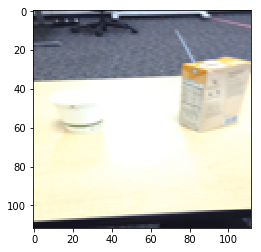

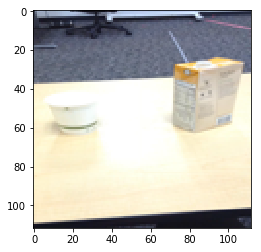

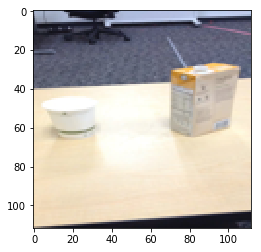

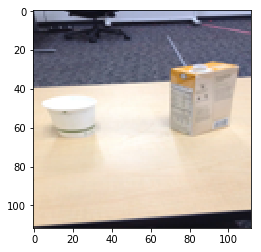

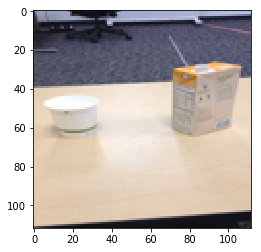

...

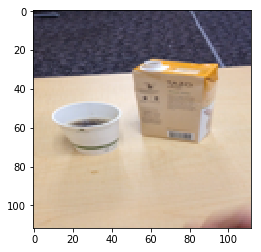

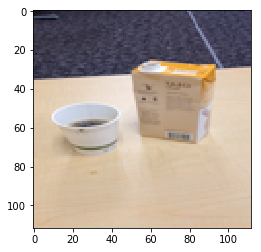

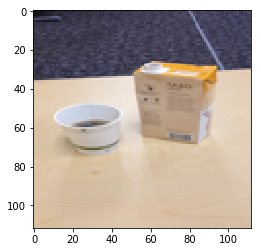

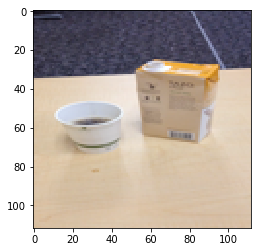

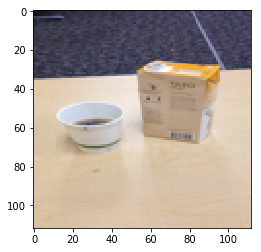

In [27]:
imagefolderpath= ('/nobackup/leopauly/IROSDataset/pour_images_new/pour0_view0') 
vids=get_vid_array(imagefolderpath)

for i in range(len(vids)):
    plt.imshow(vids[i])
    plt.show()

In [28]:
x_dis0_original=vids
features_dis0,clusters_dis0=activity_feature_extraction(vids)
print('shape of features from dis0 action: ',features_dis0.shape)

(32, 16, 112, 112, 3)
shape of clustered demo data: (32, 16, 112, 112, 3)
shape of features from dis0 action:  (32, 4608)


##### Dissimilar dataset : Colour changed

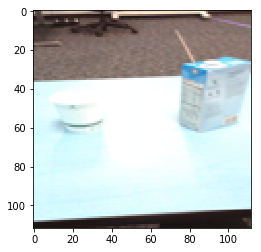

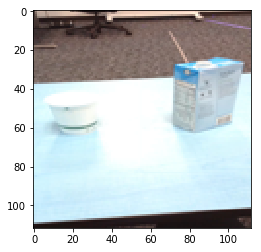

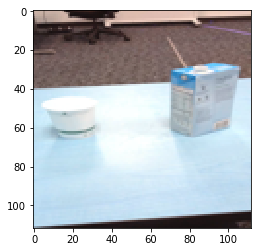

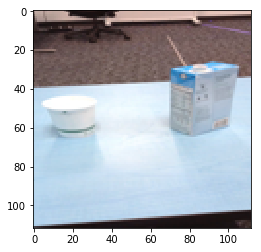

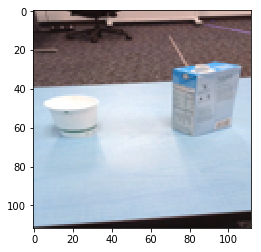

...

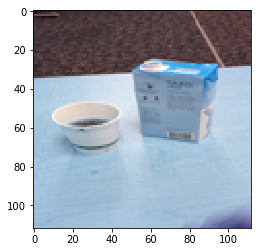

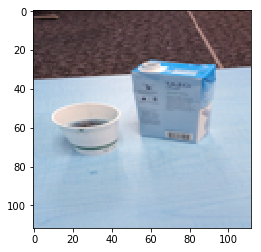

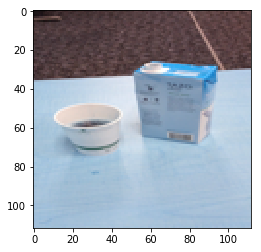

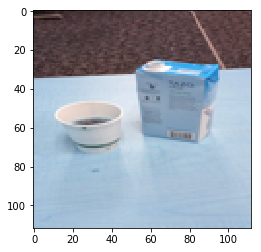

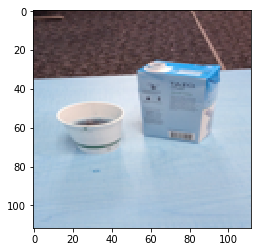

In [29]:
for i in range(len(vids)):
    im_=vids[i][:,:,::-1]
    vids[i]=im_
    
for i in range(len(vids)):
    plt.imshow(vids[i])
    plt.show()

In [30]:
x_dis0c_original=vids
features_dis0c,clusters_dis0c=activity_feature_extraction(vids)
print('shape of features from dis0c action: ',features_dis0c.shape)

(32, 16, 112, 112, 3)
shape of clustered demo data: (32, 16, 112, 112, 3)
shape of features from dis0c action:  (32, 4608)


### Rewards 

In [31]:
def reward_function(features_demo,features_robo):
    ## Calulating distance
    distance=np.zeros([num_clusters,baseline_feature_size])
    reward=np.zeros([num_clusters,1])
    for i in range(num_clusters):
        distance[i] = features_demo[i]-features_robo[i]
        reward[i]=(np.linalg.norm(distance[i]))
    #print(reward[0:5])
    #print(distance[0:5])
    return reward

In [32]:
## Robo - 0 degree
reward0=reward_function(features_demo,features_robo0)
## Robo - 0c degree
reward0c=reward_function(features_demo,features_robo0c)

In [33]:
## Robo - 90 degree
reward90=reward_function(features_demo,features_robo90)
## Robo - 90c degree
reward90c=reward_function(features_demo,features_robo90c)

In [34]:
## Robo - 180 degree
reward180=reward_function(features_demo,features_robo180)
## Robo - 180c degree
reward180c=reward_function(features_demo,features_robo180c)

In [35]:
## Robo - 270 degree
reward270=reward_function(features_demo,features_robo270)
## Robo - 270c degree
reward270c=reward_function(features_demo,features_robo270c)

In [36]:
## Dis - 0 degree
dis_reward0=reward_function(features_demo,features_dis0)
## Robo - dis0c degree
dis_reward0c=reward_function(features_demo,features_dis0c)

#### Plotting

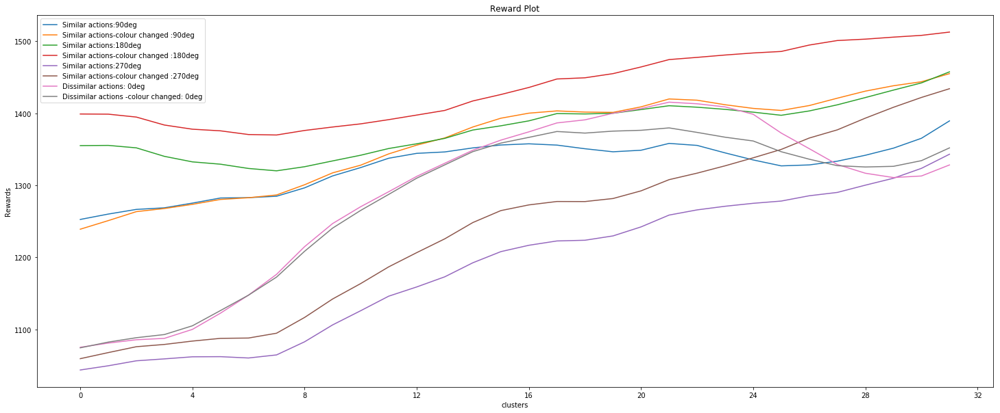

In [37]:
y_values=list(range(num_clusters))
plt.figure(figsize=(25,10))
plt.xlabel('clusters')
plt.ylabel('Rewards')
#plt.grid(True)
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.title('Reward Plot')


#line0,=plt.plot(y_values,reward0,label='Similar actions:0deg')
#line0c,=plt.plot(y_values,reward0c,label='Similar actions-colour changed :0deg')
line90,=plt.plot(y_values,reward90,label='Similar actions:90deg')
line90c,=plt.plot(y_values,reward90c,label='Similar actions-colour changed :90deg')
line180,=plt.plot(y_values,reward180,label='Similar actions:180deg')
line180c,=plt.plot(y_values,reward180c,label='Similar actions-colour changed :180deg')
line270,=plt.plot(y_values,reward270,label='Similar actions:270deg')
line270c,=plt.plot(y_values,reward270c,label='Similar actions-colour changed :270deg')


dis_line0,=plt.plot(y_values,dis_reward0,label='Dissimilar actions: 0deg')
dis_line0c,=plt.plot(y_values,dis_reward0c,label='Dissimilar actions -colour changed: 0deg')


plt.legend(handles=[line90,line90c,line180,line180c,line270,line270c,dis_line0,dis_line0c])
plt.show()
#lsp.plot_values_with_legends(y_values,reward,'reward','clusters','value','reward function',color='red',ylim=True)ß

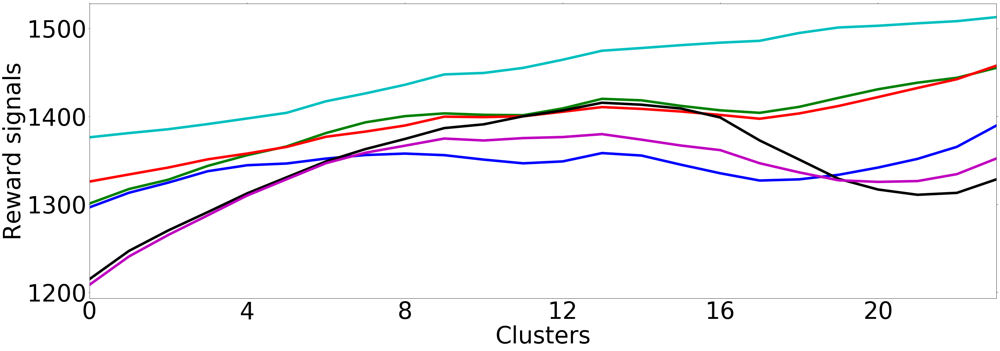

In [ ]:
import matplotlib
#matplotlib.style.use('ggplot')
matplotlib.rcParams.update({'font.size': 65})

y_values=list(range(num_clusters))
plt.figure(figsize=(45,15))
plt.xlabel('Clusters')
plt.ylabel('Reward signals')
#plt.grid(True)
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))

start=8
lim=32
y_values=range(0,24)


import matplotlib.ticker as ticker
lw=7.0

#line0,=plt.plot(y_values,reward0,label='Similar actions:0deg')
#line0c,=plt.plot(y_values,reward0c,label='Similar actions-colour changed :0deg')
line90,=plt.plot(y_values,reward90[start:lim],'b',label='Similar actions pair:1',linewidth=lw)
line90c,=plt.plot(y_values,reward90c[start:lim],'g',label='Similar actions pair:2',linewidth=lw)
line180,=plt.plot(y_values,reward180[start:lim],'r',label='Similar actions pair:3',linewidth=lw)
line180c,=plt.plot(y_values,reward180c[start:lim],'c',label='Similar actions pair:4',linewidth=lw)
#line270,=plt.plot(y_values,reward270,label='Similar actions pair:5')
#line270c,=plt.plot(y_values,reward270c,label='Similar actions pair:6')

dis_line0,=plt.plot(y_values,dis_reward0[start:lim],'k',label='Dissimilar actions pair:1',linewidth=lw)
dis_line0c,=plt.plot(y_values,dis_reward0c[start:lim],'m',label='Dissimilar actions pair:2',linewidth=lw)

TICK_SPACING_x=4
ax=plt.gca()
ax.xaxis.set_major_locator(ticker.MultipleLocator(TICK_SPACING_x))
plt.xlim(xmax = 23, xmin = 0)
ax.set_xticks([0,4,8,12, 16, 20]) # tick loc
ax.set_xticklabels(['0','4', '8', '12', '16', '20']) # set labels to display at ticks

TICK_SPACING_y=100
#ax.yaxis.set_major_locator(ticker.MultipleLocator(TICK_SPACING_y))
ax.set_yticks([1500,1400,1300,1200,]) # tick loc
ax.set_yticklabels(['1500','1400', '1300', '1200']) # set labels to display at ticks



#plt.legend(handles=[line90,line90c,line180,line180c,line270,line270c,dis_line0,dis_line0c])
plt.tick_params(axis='both',which='both',bottom=False,top=True,right=True)
plt.savefig('baseline.png')
plt.show()
#lsp.plot_values_with_legends(y_values,reward,'reward','clusters','value','reward function',color='red',ylim=True)ß

## Display

#### All videos

#### Showing clusters

cluster no:  0


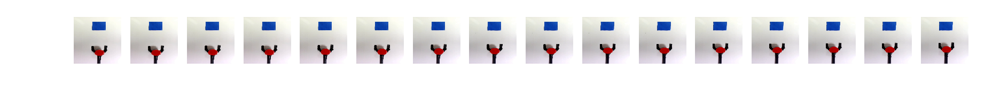

cluster no:  1


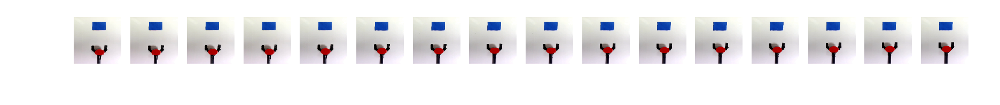

cluster no:  2


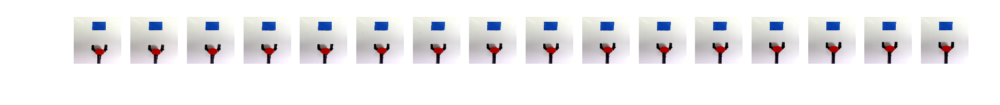

cluster no:  3


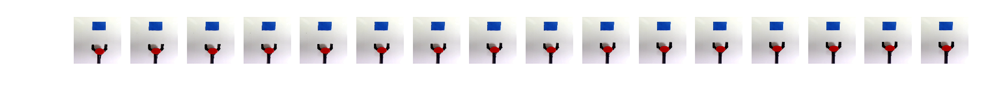

cluster no:  4


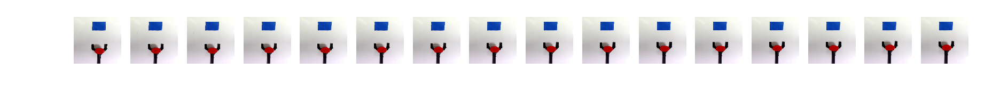

cluster no:  5


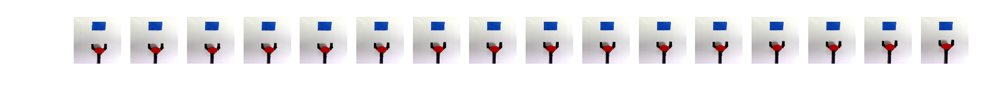

cluster no:  6


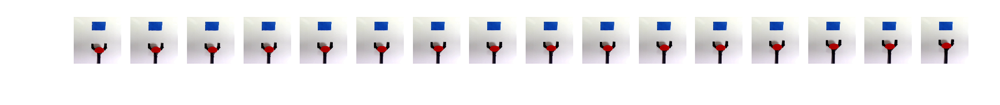

cluster no:  7


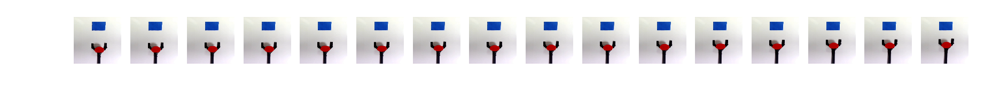

cluster no:  8


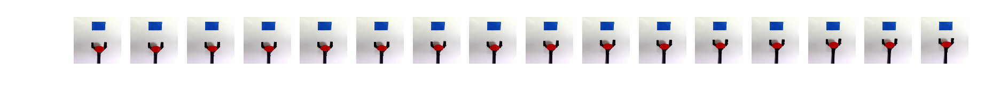

cluster no:  9


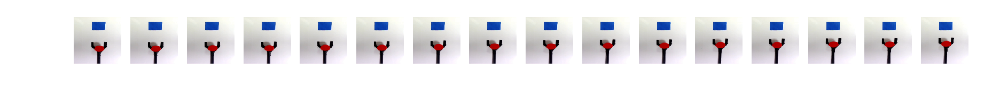

cluster no:  10


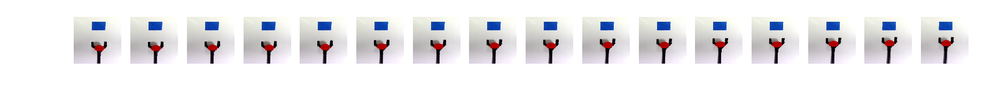

cluster no:  11


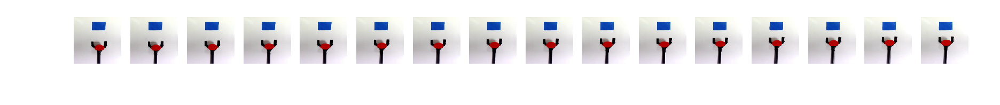

cluster no:  12


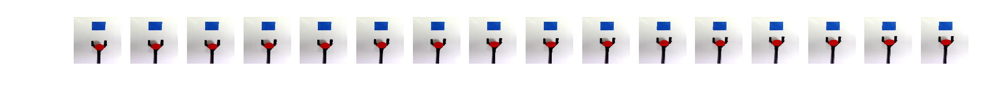

cluster no:  13


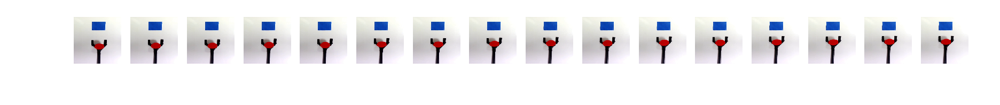

cluster no:  14


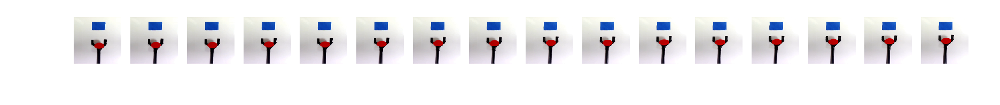

cluster no:  15


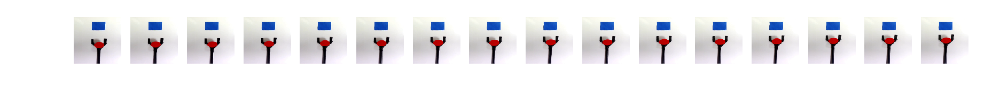

cluster no:  16


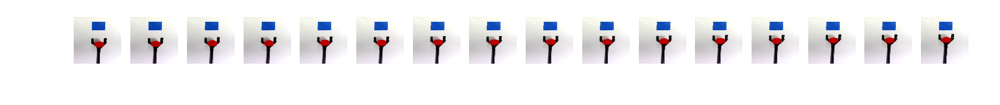

cluster no:  17


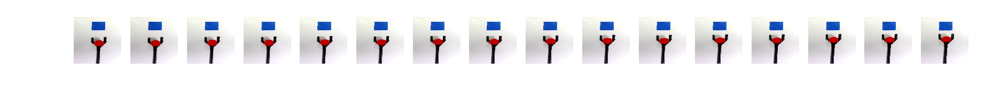

cluster no:  18


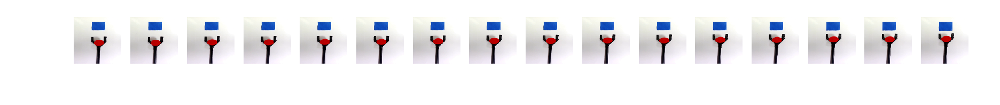

cluster no:  19


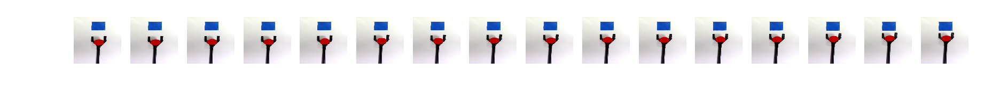

cluster no:  20


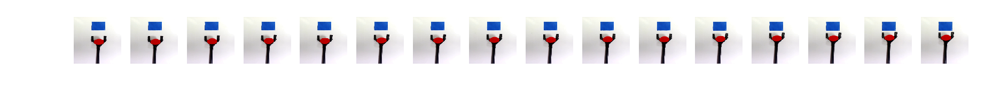

cluster no:  21


In [ ]:
y_=np.zeros([1])
## Clusters from demos
for i in range(num_clusters):
    cluster_id=i
    y_d=np.repeat(y_,num_clusters)
    print('cluster no: ',i)
    display=clusters_demo
    lsp.view_video_inline(display,y_d,cluster_length,cluster_id)

In [ ]:
## Clusters from robot action
y_r=np.repeat(y_,num_clusters)
for i in range(num_clusters):
    cluster_id=i 
    print('cluster no: ',i)
    display=clusters_robo0
    lsp.view_video_inline(display,y_r,cluster_length,cluster_id)

In [ ]:
## Clusters from robot1 action
y_r=np.repeat(y_,num_clusters)
for i in range(num_clusters):
    cluster_id=i 
    print('cluster no: ',i)
    display=clusters_robo90
    lsp.view_video_inline(display,y_r,cluster_length,cluster_id)

In [ ]:
## Clusters from robot1 action
y_r=np.repeat(y_,num_clusters)
for i in range(num_clusters):
    cluster_id=i 
    print('cluster no: ',i)
    display=clusters_robo180
    lsp.view_video_inline(display,y_r,cluster_length,cluster_id)

In [ ]:
## Clusters from robot1 action
y_r=np.repeat(y_,num_clusters)
for i in range(num_clusters):
    cluster_id=i 
    print('cluster no: ',i)
    display=clusters_robo270
    lsp.view_video_inline(display,y_r,cluster_length,cluster_id)